In [135]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Laboratory 2: Basic programing for computer vision II

## 1. Read/Show/Write an Image

### 1.1. Read and Write Image
For typical Python code, you may write the code on the .py file like this:

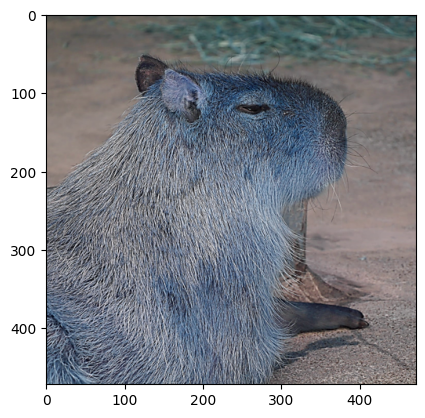

In [136]:
import cv2
import sys
import matplotlib.pyplot as plt

img = cv2.imread("/content/drive/MyDrive/Computer vision/lab2/Images/capybara.png")

#import cv2 as cv
#import sys
#img = cv.imread(“IN_FILE_PATH")
#if img is None:
#sys.exit("Could not read the image.")
#cv.imshow("Display window", img)
#k = cv.waitKey(0)
#if k == ord("s"):
#cv.imwrite(“OUT_FILE_PATH", img)
#cv2.destroyAllWindows()

plt.imshow(img)
plt.show()

For Jupyter Notebook code, we cannot use the HighGUI in OpenCV. So, we have to use other python library (such as matplotlib) for showing an image instead

In [137]:
import cv2
import sys

img = cv2.imread("/content/drive/MyDrive/Computer vision/lab2/Images/lenna.png")

if img is None:
    sys.exit("Could not read the image.")

### 1.2. Show Color Image by matplotlib

In [138]:
# cv2.imshow() is not suitable for notebook style programing.
# Instead, we use matplotlib to show image on jupyter notebook

import matplotlib.pyplot as plt

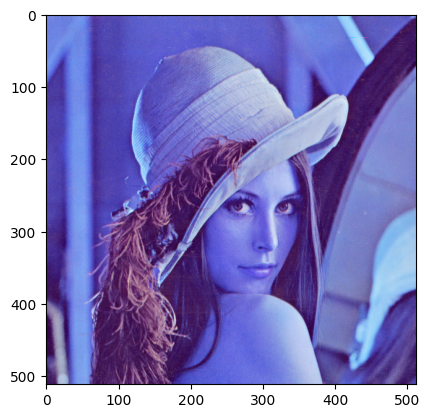

In [139]:
# display the image
plt.imshow(img)
plt.show()

### 1.3. Grayscale Conversion

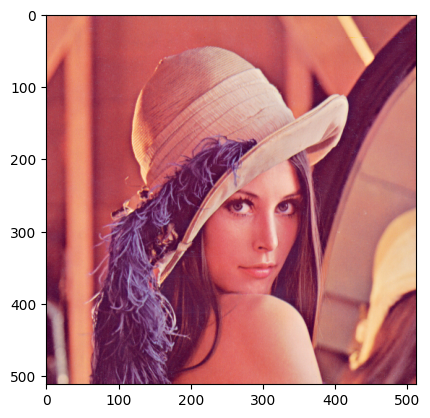

In [140]:
# display the image
img_plt = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #We ned to convert RGB(OpenCV) to BGR(matplotlib) color model
plt.imshow(img_plt)
plt.show()

### 1.4. Show Grayscale Image by matplotlib

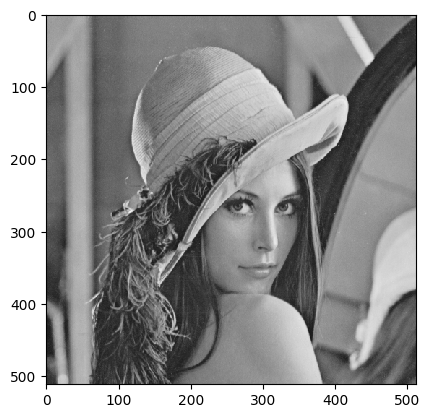

In [141]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## 2. Image Properties

### 2.1. Seeing inside Matrix


In [142]:
print(img)

[[[125 137 226]
  [125 137 226]
  [133 137 223]
  ...
  [122 148 230]
  [110 130 221]
  [ 90  99 200]]

 [[125 137 226]
  [125 137 226]
  [133 137 223]
  ...
  [122 148 230]
  [110 130 221]
  [ 90  99 200]]

 [[125 137 226]
  [125 137 226]
  [133 137 223]
  ...
  [122 148 230]
  [110 130 221]
  [ 90  99 200]]

 ...

 [[ 60  18  84]
  [ 60  18  84]
  [ 58  27  92]
  ...
  [ 84  73 173]
  [ 76  68 172]
  [ 79  62 177]]

 [[ 57  22  82]
  [ 57  22  82]
  [ 62  32  96]
  ...
  [ 79  70 179]
  [ 81  71 181]
  [ 81  74 185]]

 [[ 57  22  82]
  [ 57  22  82]
  [ 62  32  96]
  ...
  [ 79  70 179]
  [ 81  71 181]
  [ 81  74 185]]]


### 2.2. Image Type

In [143]:
## Add code here
print(type(img))

<class 'numpy.ndarray'>


### 2.3. Image Size #1

In [144]:
## Add code here
print(img.shape)

(512, 512, 3)


### 2.4. Image Size #2

In [145]:
## Add code here
nrows = img.shape[0]
ncols = img.shape[1]
nchannels = img.shape[2]
print(nrows)
print(ncols)
print(nchannels)

512
512
3


## 3. Resize Image

In [146]:
# 3.1. Image size #1
## Add code here
resized_img1 = cv2.resize(img,None,fx=0.5,fy=0.5,interpolation=cv2.INTER_LINEAR)

In [147]:
# 3.2. Image size #2
## Add code here
new_rows = 300
new_cols = 300
dim = (new_cols,new_rows)
resized_img2 = cv2.resize(img,dim,interpolation=cv2.INTER_LINEAR)

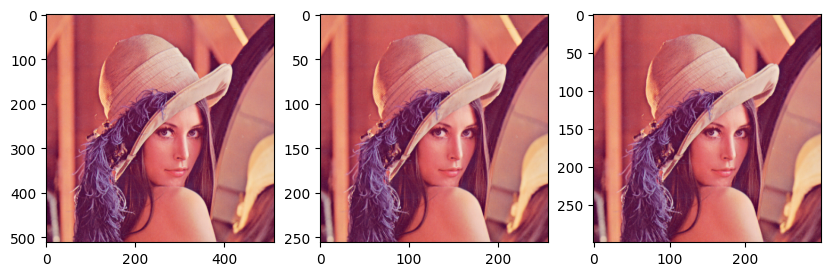

In [148]:
# 3.3. Show Image on suplots
## Add code here
fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,10))
ax1.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
ax2.imshow(cv2.cvtColor(resized_img1,cv2.COLOR_BGR2RGB))
ax3.imshow(cv2.cvtColor(resized_img2,cv2.COLOR_BGR2RGB))
plt.show()

In [149]:
print(img.shape)
print(resized_img1.shape)
print(resized_img2.shape)

(512, 512, 3)
(256, 256, 3)
(300, 300, 3)


## 4. Copy an image (Cloning)

In [150]:
## WARNING !!!!
# DO NOT USE:
#      img_clone = img
# It will point 'img' to 'img_clone'
#i = 50

img_clone = img.copy()

## 5. Accessing Pixels

In [151]:
# 5.1. Accessing a pixel #1
## Add code here
px = img[100,100]
print(px)

[ 78  68 178]


In [152]:
# 5.2. Accessing a pixel #2
## Add code here
px_blue = img[100,100,0]
print(px_blue)

78


## 6. Image Region Of Interest (ROI)

In [153]:
# 6. Image ROI
## Add code here
roi = resized_img2[150:200,150:200]
roi.shape

(50, 50, 3)

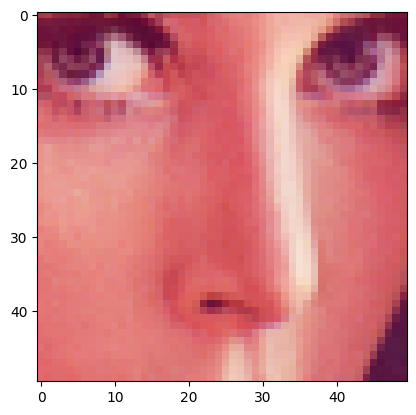

In [154]:
#display the image
plt.imshow(cv2.cvtColor(roi,cv2.COLOR_BGR2RGB))
plt.show()

## 7. Editing Pixels

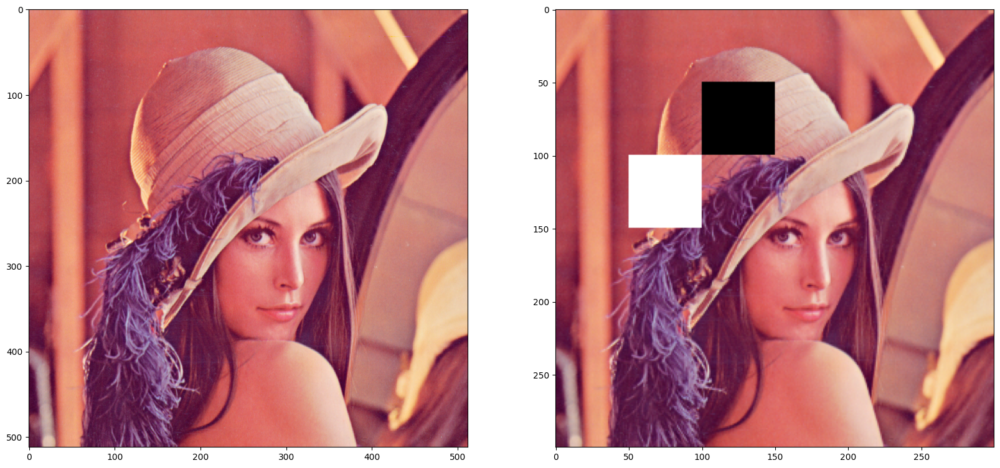

In [155]:
# 7. Editing Pixels
## Add code here
img_edited = resized_img2.copy()

#Edit pixel from range
img_edited[50:100,100:150] = [0,0,0]
img_edited[100:150,50:100] = 255

#display the images
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,10))
ax1.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
ax2.imshow(cv2.cvtColor(img_edited,cv2.COLOR_BGR2RGB))
plt.show()

## 8. Split & Merge Channels

In [156]:
# 8.1. Split Channels #1
## Add code here
img_b,img_g,img_r = cv2.split(img)

In [157]:
#img_g[:,:] = 0 # edit every pixel of green image plane to be zero !

(512, 512, 3)
(512, 512)
(512, 512)
(512, 512)


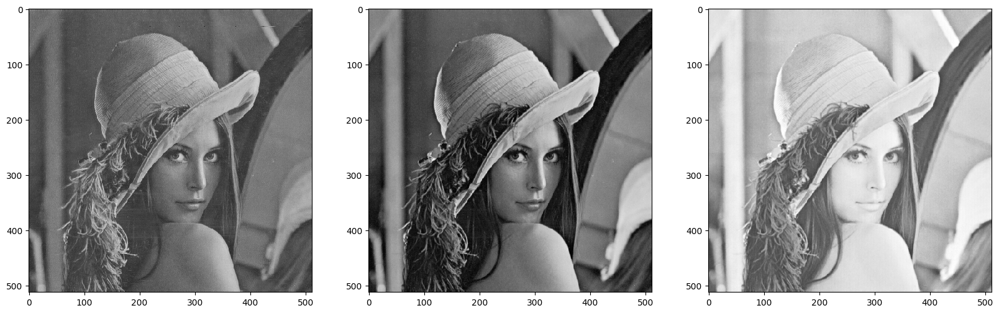

In [158]:
# 8.3. Check Outputs
print(img.shape)
print(img_b.shape)
print(img_g.shape)
print(img_r.shape)

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_b, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_g, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_r, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

Alternatively, you can also try to split matrix by:

In [159]:
# 8.2. Split Channels #2
## Add code here
img_b = img[:,:,0].copy()
img_g = img[:,:,1].copy()
img_r = img[:,:,2].copy()

(512, 512, 3)
(512, 512)
(512, 512)
(512, 512)


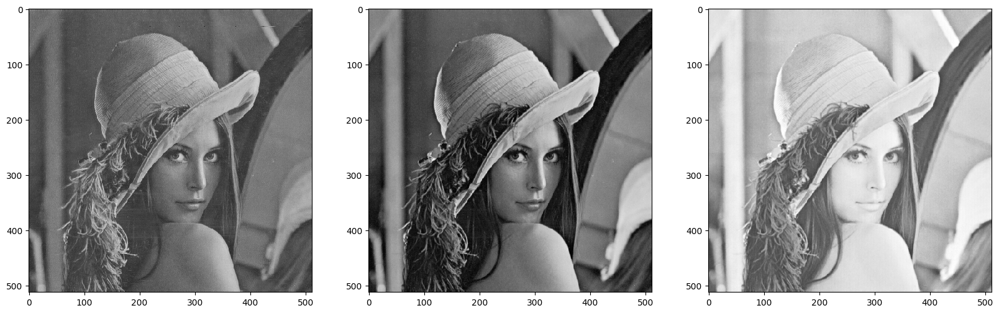

In [160]:
# 8.3. Check Outputs
print(img.shape)
print(img_b.shape)
print(img_g.shape)
print(img_r.shape)

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_b, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_g, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_r, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

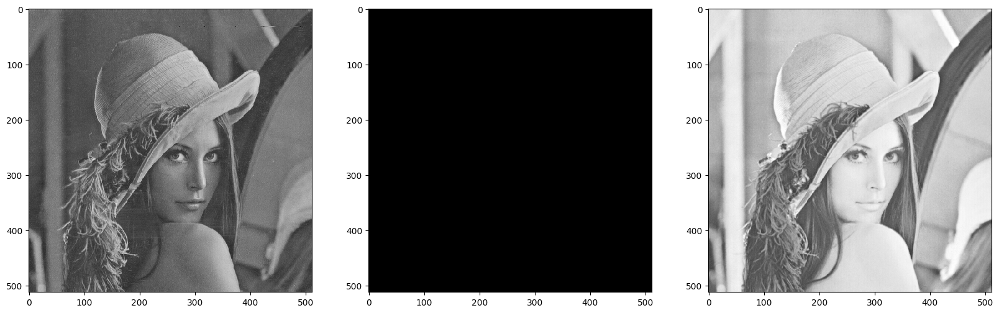

In [161]:
# Try to edit every pixel to be zero !
img_g[:,:] = 0

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_b, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_g, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_r, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

In [162]:
# 8.4. Merge Channels
## Add code here
img_merged = cv2.merge([img_b,img_g, img_r])
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax2.imshow(cv2.cvtColor(img_merged, cv2.COLOR_BGR2RGB))
plt.show()

## 9. Color Conversion

9.1. BGR -> HSV

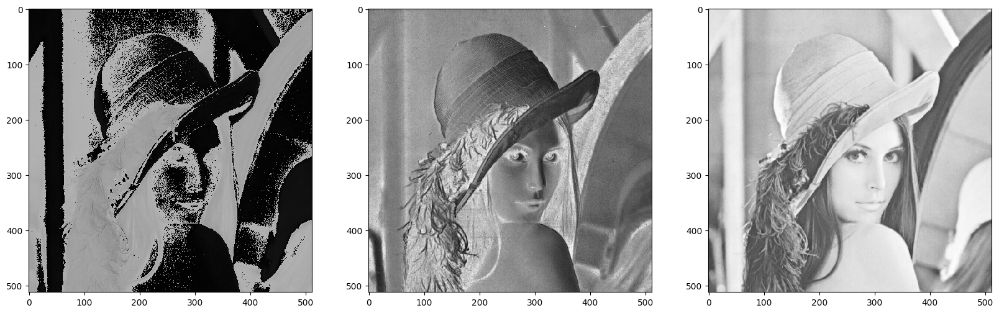

In [163]:
## Add code here
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
img_h = img_hsv[:,:,0].copy()
img_s = img_hsv[:,:,1].copy()
img_v = img_hsv[:,:,2].copy()
# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_h, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_s, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_v, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

9.2. BGR -> Lab

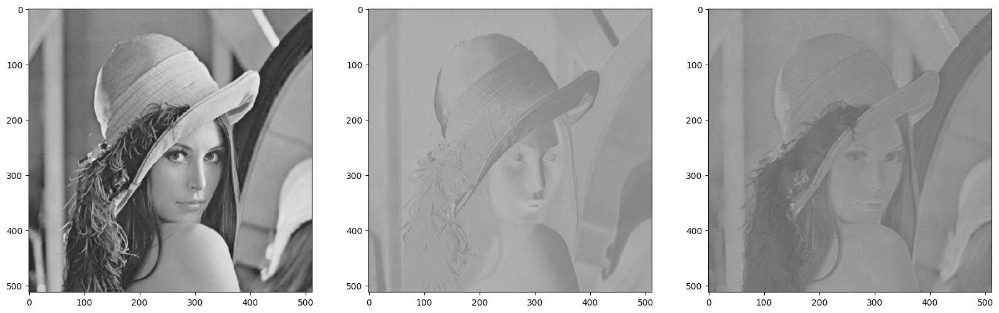

In [164]:
## Add code here
img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
img_l = img_lab[:,:,0].copy()
img_a = img_lab[:,:,1].copy()
img_b = img_lab[:,:,2].copy()
# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_l, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_a, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_b, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## 10. Visualization

### 10.1. Histogram of a grayscale image

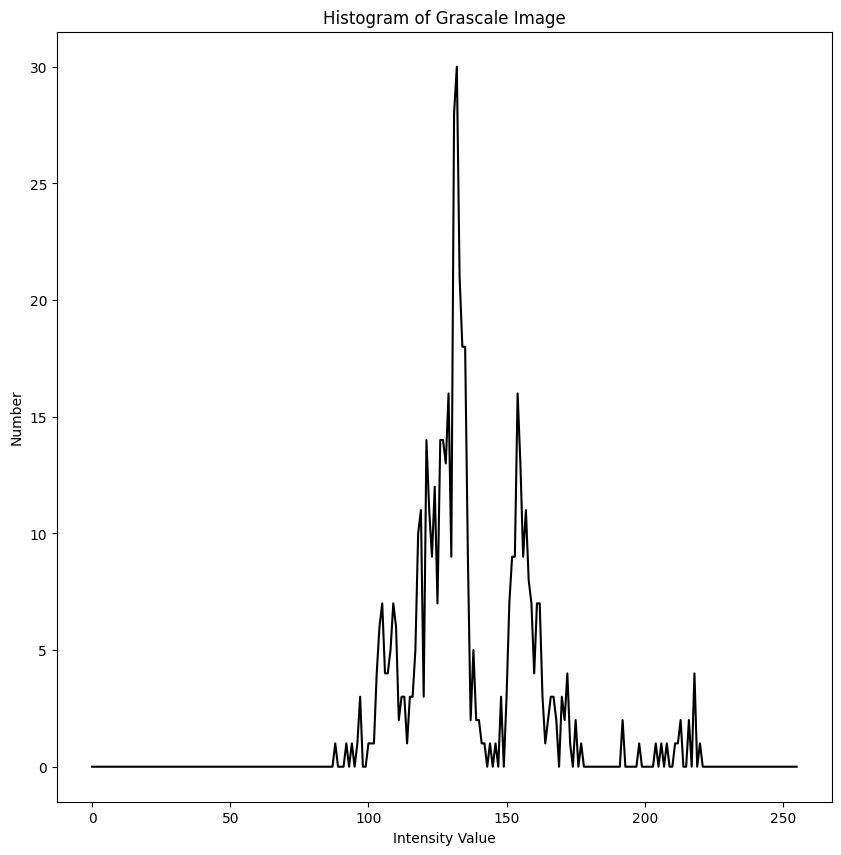

In [165]:
## Add code here
histogram_gray = cv2.calcHist(img_gray, [0], None, [256], [0, 256])
# Plot Histogram
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.plot(histogram_gray, color='k')
plt.title('Histogram of Grascale Image')
plt.ylabel('Number')
plt.xlabel('Intensity Value')
plt.show()

### 10.2. Histogram of each BGR image plane

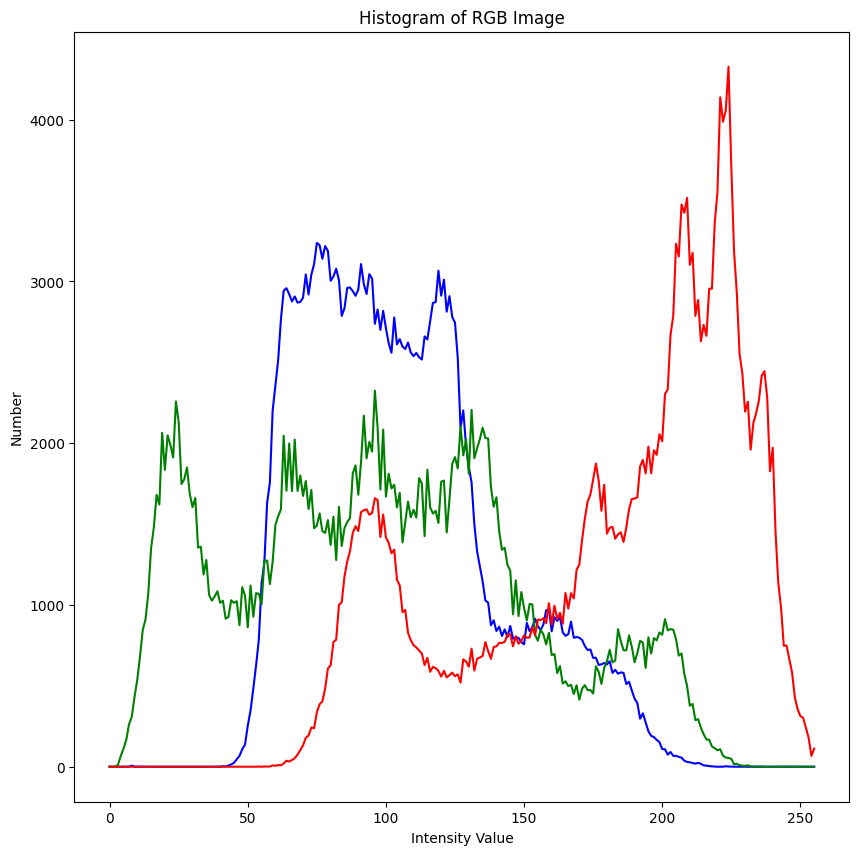

In [166]:
# Histogram of each BGR image plane
## Add code here
histogram_b = cv2.calcHist([img], [0], None, [256], [0, 256])
histogram_g = cv2.calcHist([img], [1], None, [256], [0, 256])
histogram_r = cv2.calcHist([img], [2], None, [256], [0, 256])
# Plot Histogram
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.plot(histogram_b, color='b')
plt.plot(histogram_g, color='g')
plt.plot(histogram_r, color='r')
plt.title('Histogram of RGB Image')
plt.ylabel('Number')
plt.xlabel('Intensity Value')
plt.show()


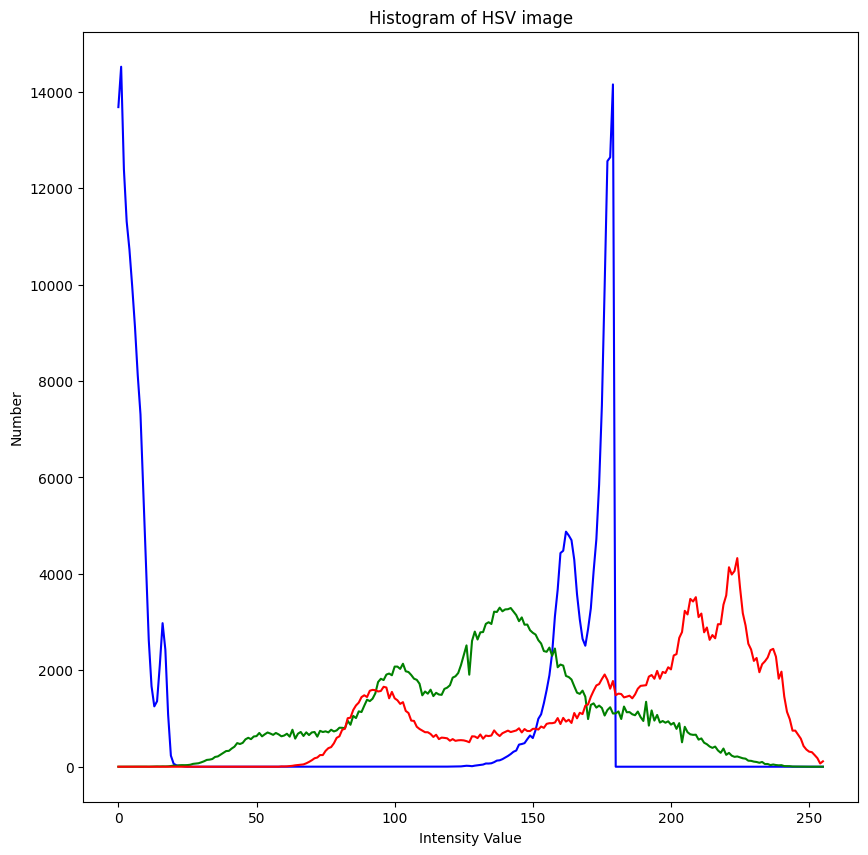

In [167]:
# Histogram of each HSV image plane
## Add code here
histogram_h = cv2.calcHist([img_hsv], [0], None, [256], [0, 256])
histogram_s = cv2.calcHist([img_hsv], [1], None, [256], [0, 256])
histogram_v = cv2.calcHist([img_hsv], [2], None, [256], [0, 256])
# Plot Histogram
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.plot(histogram_h, color='b')
plt.plot(histogram_s, color='g')
plt.plot(histogram_v, color='r')
plt.title('Histogram of HSV image')
plt.ylabel('Number')
plt.xlabel('Intensity Value')
plt.show()

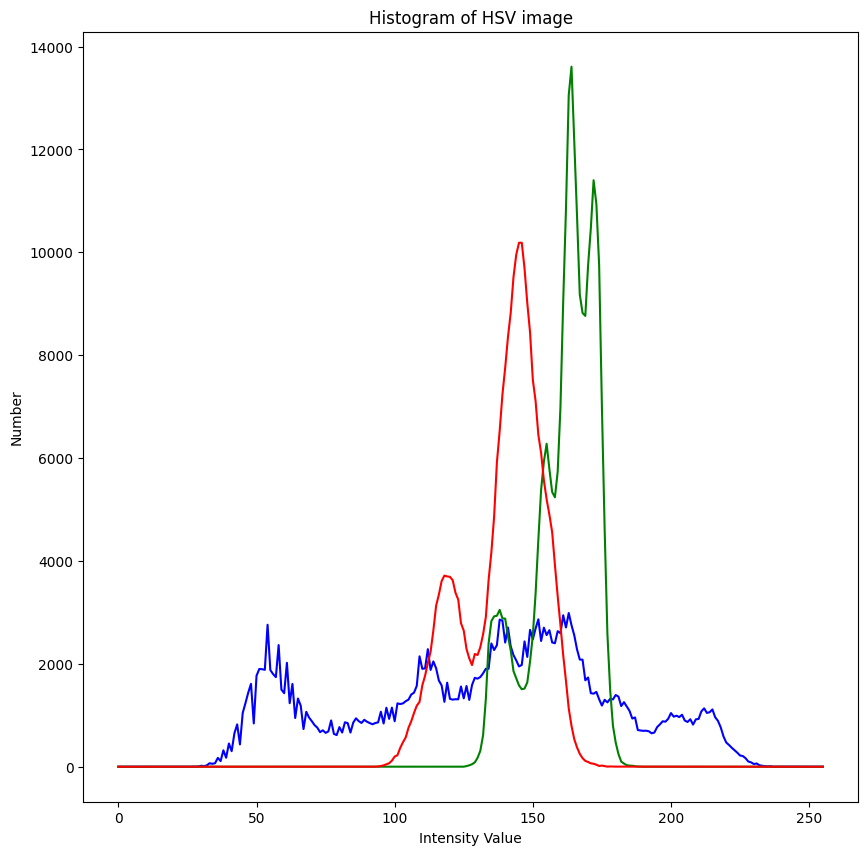

In [168]:
# Histogram of each L*a*b* image plane
## Add code here
histogram_l = cv2.calcHist([img_lab], [0], None, [256], [0, 256])
histogram_a = cv2.calcHist([img_lab], [1], None, [256], [0, 256])
histogram_b = cv2.calcHist([img_lab], [2], None, [256], [0, 256])
# Plot Histogram
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.plot(histogram_l, color='b')
plt.plot(histogram_a, color='g')
plt.plot(histogram_b, color='r')
plt.title('Histogram of HSV image')
plt.ylabel('Number')
plt.xlabel('Intensity Value')
plt.show()

### 10.3. Scatter Plot 2D

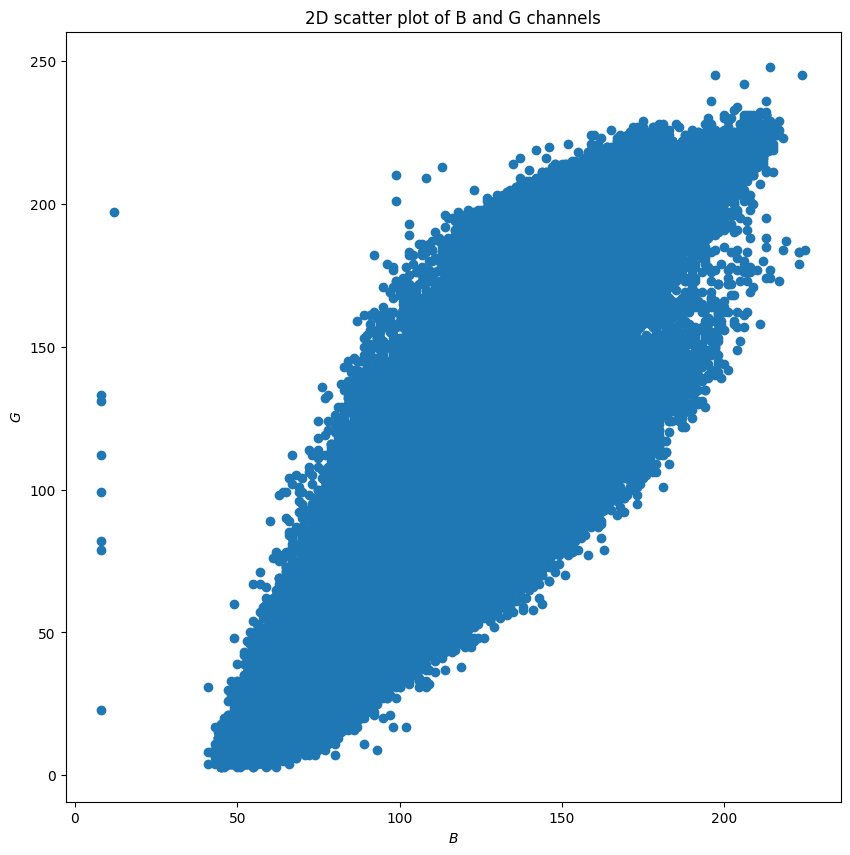

In [169]:
# plot scatter plot over B and G
## Add code here
pixel_rgb_values = img.reshape((-1, 3))
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.scatter(pixel_rgb_values[:,0], pixel_rgb_values[:,1])
plt.xlabel('$B$', fontsize=10)
plt.ylabel('$G$', fontsize=10)
plt.title('2D scatter plot of B and G channels')
plt.show()

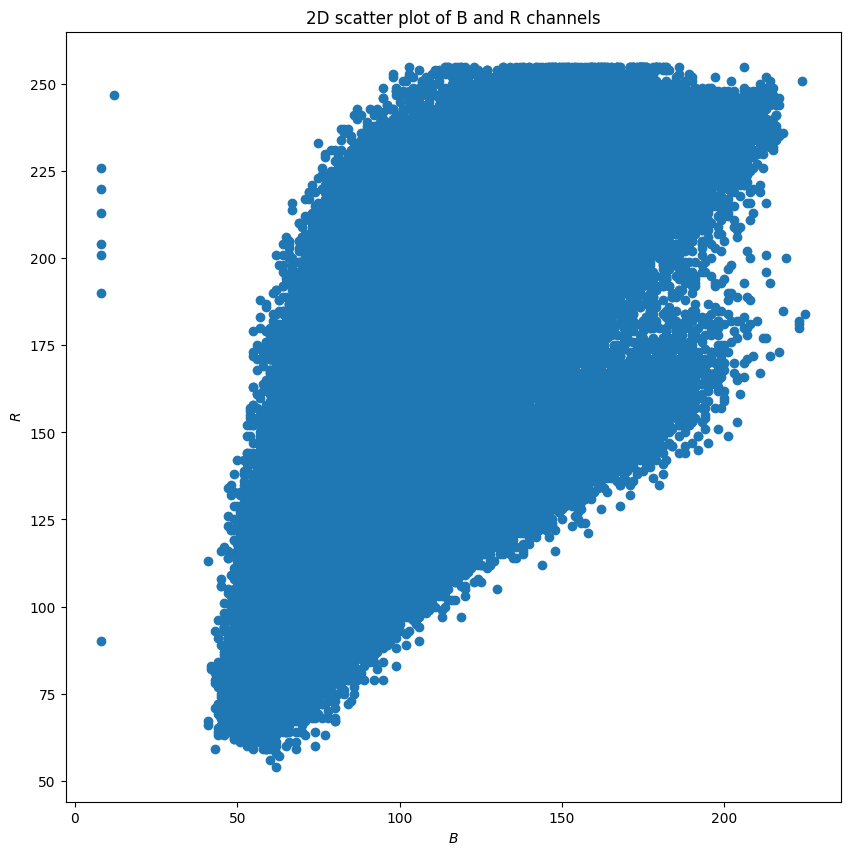

In [170]:
# plot scatter plot over B and R
## Add code here
pixel_rgb_values = img.reshape((-1, 3))
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.scatter(pixel_rgb_values[:,0], pixel_rgb_values[:,2])
plt.xlabel('$B$', fontsize=10)
plt.ylabel('$R$', fontsize=10)
plt.title('2D scatter plot of B and R channels')
plt.show()

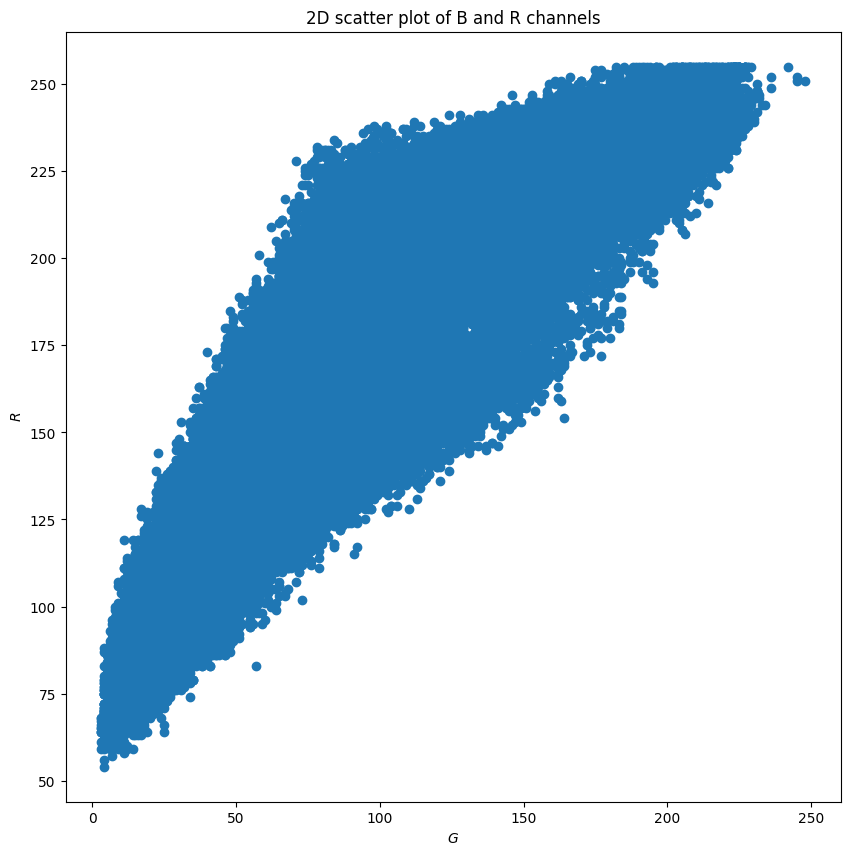

In [171]:
# plot scatter plot over G and R
## Add code here
pixel_rgb_values = img.reshape((-1, 3))
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.scatter(pixel_rgb_values[:,1], pixel_rgb_values[:,2])
plt.xlabel('$G$', fontsize=10)
plt.ylabel('$R$', fontsize=10)
plt.title('2D scatter plot of B and R channels')
plt.show()

### 10.4. Scatter plot 3D

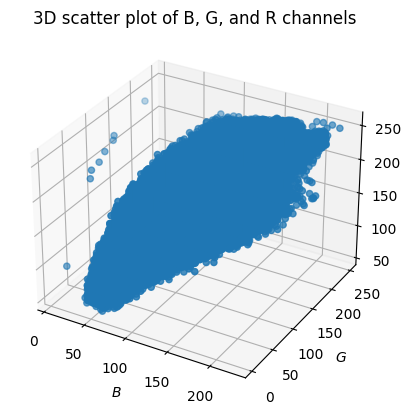

In [172]:
# plot scatter plot of RGB
## Add code here
pixel_rgb_values = img.reshape((-1, 3))
fig1 = plt.figure()
ax1 = fig1.add_subplot(111, projection='3d')
ax1.scatter(pixel_rgb_values[:,0], pixel_rgb_values[:,1], pixel_rgb_values[:,2])
ax1.set_xlabel('$B$', fontsize=10)
ax1.set_ylabel('$G$', fontsize=10)
ax1.set_zlabel('$R$', fontsize=10)
ax1.set_title('3D scatter plot of B, G, and R channels')
plt.show()

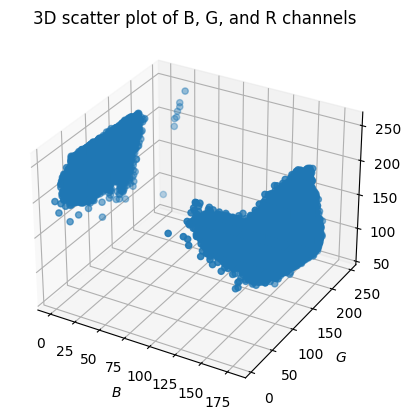

In [173]:
# plot scatter plot of HSV
## Add code here
pixel_rgb_values = img_hsv.reshape((-1, 3))
fig1 = plt.figure()
ax1 = fig1.add_subplot(111, projection='3d')
ax1.scatter(pixel_rgb_values[:,0], pixel_rgb_values[:,1], pixel_rgb_values[:,2])
ax1.set_xlabel('$B$', fontsize=10)
ax1.set_ylabel('$G$', fontsize=10)
ax1.set_zlabel('$R$', fontsize=10)
ax1.set_title('3D scatter plot of B, G, and R channels')
plt.show()

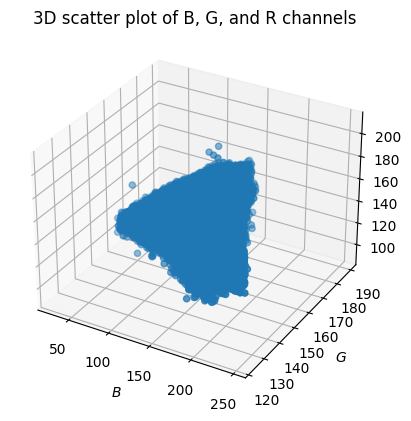

In [174]:
# plot scatter plot of Lab
## Add code here
pixel_rgb_values = img_lab.reshape((-1, 3))
fig1 = plt.figure()
ax1 = fig1.add_subplot(111, projection='3d')
ax1.scatter(pixel_rgb_values[:,0], pixel_rgb_values[:,1], pixel_rgb_values[:,2])
ax1.set_xlabel('$B$', fontsize=10)
ax1.set_ylabel('$G$', fontsize=10)
ax1.set_zlabel('$R$', fontsize=10)
ax1.set_title('3D scatter plot of B, G, and R channels')
plt.show()

# Assignment Q1

In [175]:
# Write your code here
img_own = cv2.imread('/content/drive/MyDrive/Computer vision/lab2/Images/yama_ajisai.jpg')

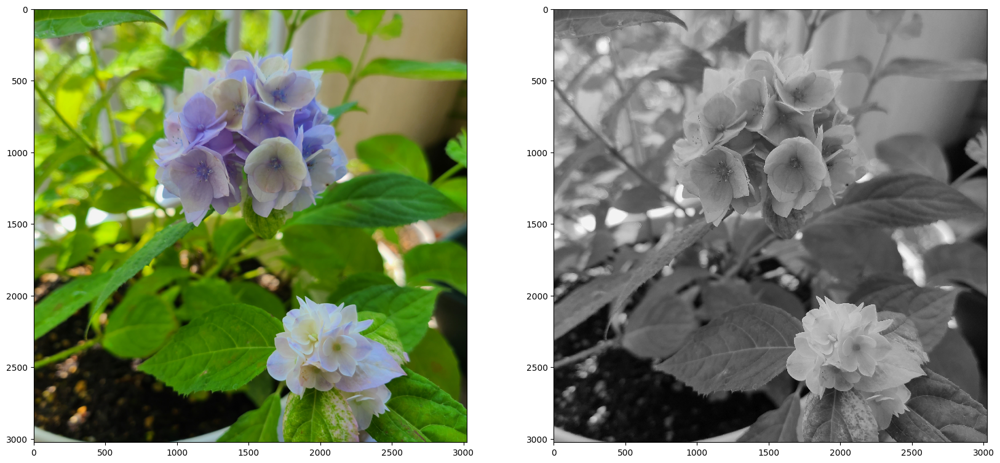

In [176]:
#grayscale format
img_gray1 = cv2.cvtColor(img_own, cv2.COLOR_BGR2GRAY)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(img_own,cv2.COLOR_BGR2RGB))
ax2.imshow(img_gray1, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

#plt.imshow(img_gray1, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
#plt.show()

In [177]:
K = 15
img_gray2 = img_gray1.copy()
img_gray2 = img_gray2[:,:] + K

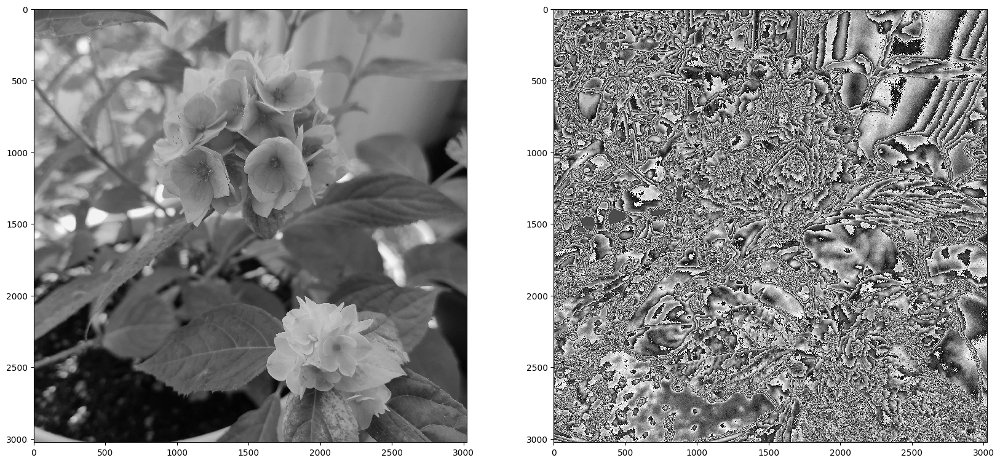

In [178]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray1, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_gray2, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

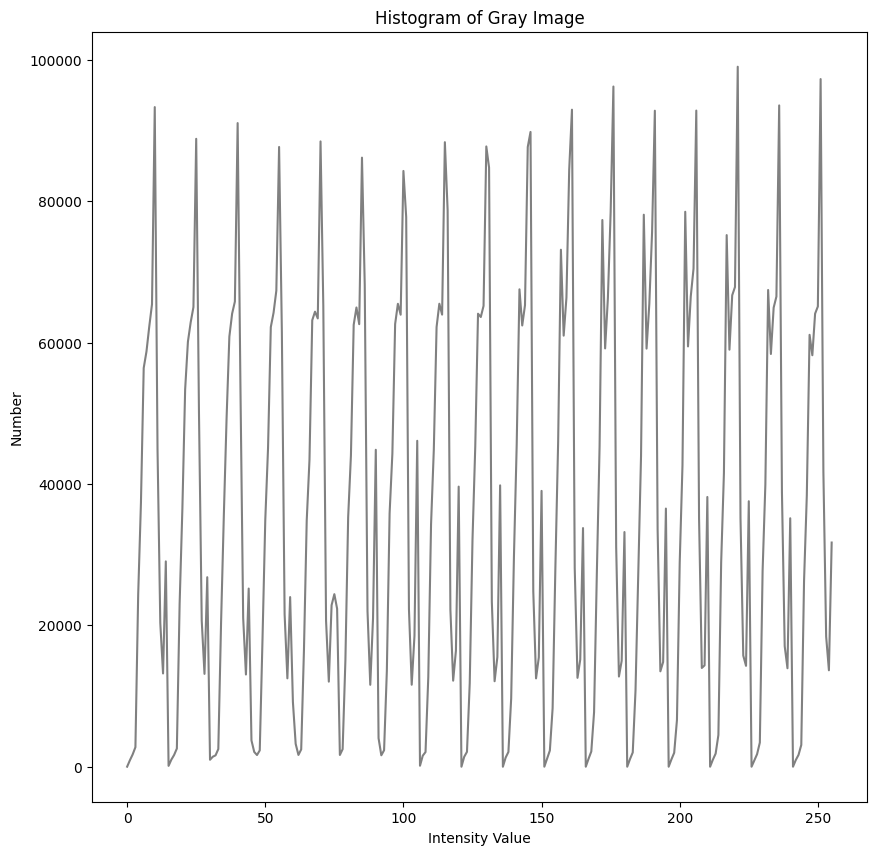

In [179]:
# Histogram of each BGR image plane
## Add code here
histogram_gray = cv2.calcHist([img_gray2], [0], None, [256], [0, 256])
# Plot Histogram
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.plot(histogram_gray, color='gray')
plt.title('Histogram of Gray Image')
plt.ylabel('Number')
plt.xlabel('Intensity Value')
plt.show()


# Assignment Q2

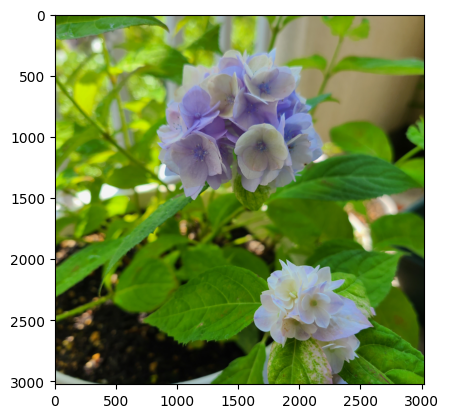

In [185]:
# Write your code here
img_own = cv2.imread('/content/drive/MyDrive/Computer vision/lab2/Images/yama_ajisai.jpg')
plt.imshow(img_own)
plt.show()

In [186]:
img_r = img_own[:,:,2].copy()

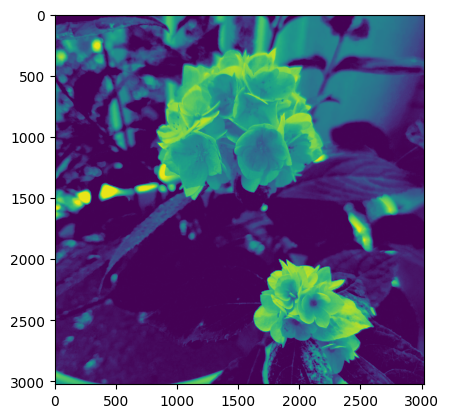

In [187]:
plt.imshow(img_r)
plt.show()

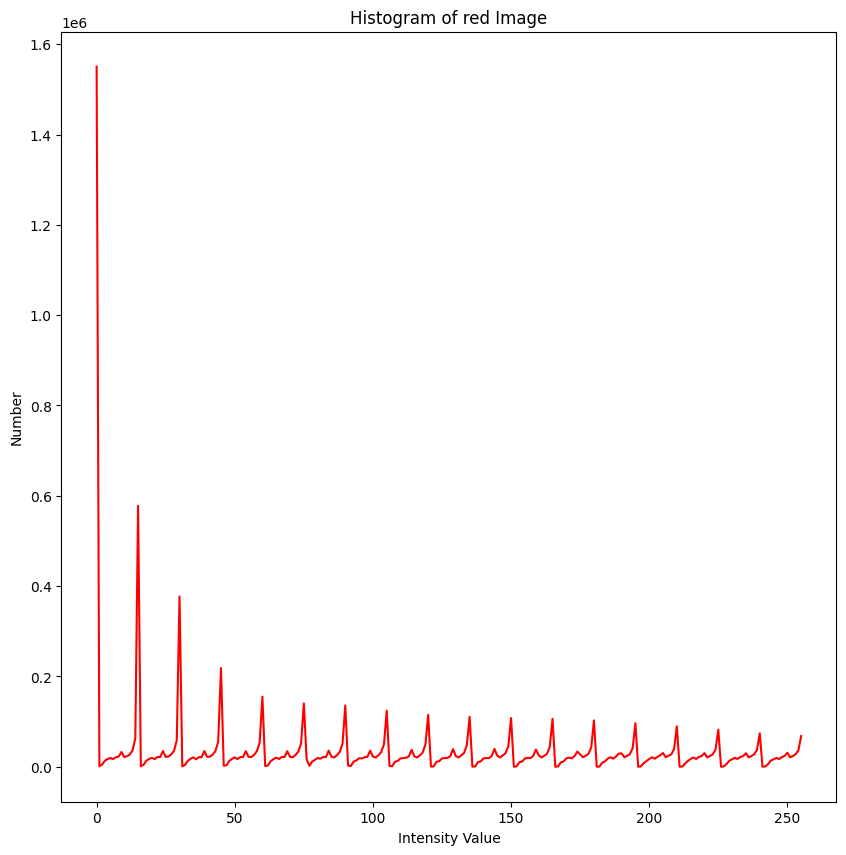

In [189]:
img_r = img_r[:,:] + K

histogram_red = cv2.calcHist([img_r], [0], None, [256], [0, 256])
# Plot Histogram
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.plot(histogram_red, color='red')
plt.title('Histogram of red Image')
plt.ylabel('Number')
plt.xlabel('Intensity Value')
plt.show()